# License 
***
Copyright (C) 2017--2022 J. Patrick Hall, jphall@gwu.edu

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

1. Python Imports and Config

In [1]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# to upload local files
import io
from google.colab import files  

# display matplotlib graphics in notebook
%matplotlib inline

# for better reproducibility
SEED = 12345

2. Install Java for h2o

In [2]:
# install Java for h2o backend
!apt-get install default-jre
!java -version

Reading package lists... Done
Building dependency tree       
Reading state information... Done
default-jre is already the newest version (2:1.11-68ubuntu1~18.04.1).
default-jre set to manually installed.
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.
openjdk version "11.0.14" 2022-01-18
OpenJDK Runtime Environment (build 11.0.14+9-Ubuntu-0ubuntu2.18.04)
OpenJDK 64-Bit Server VM (build 11.0.14+9-Ubuntu-0ubuntu2.18.04, mixed mode, sharing)


3. Install h2o python package

In [3]:
# install h2o
!pip install h2o 

     |████████████████████████████████| 176.2 MB 1.7 kB/s 
  Created wheel for h2o: filename=h2o-3.36.0.4-py2.py3-none-any.whl size=176245474 sha256=13f5d4255962dece1b489e8b4d73dbc3c61cafb0151536e3a08c7ddecab49c43
  Stored in directory: /root/.cache/pip/wheels/66/7c/3b/6558f625a9415a96f7f650d33f1def07b6e30b0c871e8407a1
Successfully built h2o


4. Start h2o

In [4]:
# start and connect to h2o server
import h2o
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
from h2o.estimators.kmeans import H2OKMeansEstimator
from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator

h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.14" 2022-01-18; OpenJDK Runtime Environment (build 11.0.14+9-Ubuntu-0ubuntu2.18.04); OpenJDK 64-Bit Server VM (build 11.0.14+9-Ubuntu-0ubuntu2.18.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpayfcxqa9
  JVM stdout: /tmp/tmpayfcxqa9/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpayfcxqa9/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.4
H2O_cluster_version_age:,"7 days, 22 hours and 46 minutes"
H2O_cluster_name:,H2O_from_python_unknownUser_m8fed3
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


5. Upload example data

In [5]:
# special google collab command to upload a file from computer
uploaded = files.upload() # REQUIRES STUDENT INPUT

Saving loan_clean.csv to loan_clean.csv


In [6]:
# 6
uploaded.keys() # what is stored in that Python object?

dict_keys(['loan_clean.csv'])

7. Define character column types carefully

In [7]:
# define input variable measurement levels 
# strings automatically parsed as enums (nominal)
# numbers automatically parsed as numeric
col_types = {'bad_loan': 'enum',
             'GRP_addr_state': 'enum',
             'GRP_home_ownership': 'enum',
             'GRP_verification_status': 'enum',
             'GRP_REP_home_ownership': 'enum',
             'GRP_purpose': 'enum'}

8. Read data into h2o

In [8]:
raw = pd.read_csv(io.StringIO(uploaded['loan_clean.csv'].decode('utf-8'))) # name in quotes here must match name in 6 above
frame = h2o.H2OFrame(raw, column_types=col_types)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


9. Display a summary of the data

In [9]:
frame.describe()

Rows:163987
Cols:18




,id,bad_loan,GRP_REP_home_ownership,GRP_addr_state,GRP_home_ownership,GRP_purpose,GRP_verification_status,_WARN_,STD_IMP_REP_annual_inc,STD_IMP_REP_delinq_2yrs,STD_IMP_REP_dti,STD_IMP_REP_emp_length,STD_IMP_REP_int_rate,STD_IMP_REP_loan_amnt,STD_IMP_REP_longest_credit_lengt,STD_IMP_REP_revol_util,STD_IMP_REP_term_length,STD_IMP_REP_total_acc
type,int,enum,enum,enum,enum,enum,enum,enum,real,real,real,real,real,real,real,real,real,real
mins,10001.0,,,,,,,,-1.767455639,-0.39219617,-2.119639396,-1.621390274,-1.907046215,-1.587129405,-2.22445124,-2.164541326,-0.516495577,-2.058861889
mean,91994.0,,,,,,,,2.387462276473699e-11,2.2959629066111824e-12,6.806996063566656e-11,-3.56684125477177e-11,-8.94898373063177e-12,8.311978604195218e-11,5.061216804497757e-11,-1.473401161127105e-11,-1.500958899951462e-10,8.06430800103611e-13
maxs,173987.0,,,,,,,,4.6180619798,4.1566950661,3.037148727,1.2288169612,2.8376799992,2.7671323946,3.1431598296,3.0363495275,1.9718787627,3.0684672884
sigma,47339.11363414683,,,,,,,,0.9999999999982875,0.999999999921252,1.0000000000037716,1.0000000000339822,1.0000000000199512,0.9999999999852869,0.9999999999850577,1.000000000017688,1.0000000000642097,1.000000000033184
zeros,0,,,,,,,,0,0,0,0,0,0,0,0,0,0
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,10001.0,0.0,3.0,14.0,3.0,3.0,2.0,nan,-1.199299502,-0.39219617,1.5712460425,1.2288169612,-0.704773051,-1.019182214,1.683902485,1.1858716502,-0.516495577,-1.359278248
1,10002.0,1.0,3.0,10.0,3.0,8.0,2.0,nan,-1.04507688,-0.39219617,-1.986153485,-1.621390274,0.3572732234,-1.334708431,-0.420595674,-1.788270335,1.9718787627,-1.796518023
2,10003.0,0.0,3.0,7.0,3.0,7.0,3.0,nan,-1.501267394,-0.39219617,-0.955642252,1.2288169612,0.5158905241,-1.34732948,-0.721238269,1.7782983174,-0.516495577,-1.271830292


10. Assign basic modeling roles -- `y` will not be used

In [10]:
# assign target and inputs
y = 'bad_loan'
X = [name for name in frame.columns if name not in ['id', '_WARN_', 'GRP_home_ownership', y]]
print(y)
print(X)
print(len(X))

bad_loan
['GRP_REP_home_ownership', 'GRP_addr_state', 'GRP_purpose', 'GRP_verification_status', 'STD_IMP_REP_annual_inc', 'STD_IMP_REP_delinq_2yrs', 'STD_IMP_REP_dti', 'STD_IMP_REP_emp_length', 'STD_IMP_REP_int_rate', 'STD_IMP_REP_loan_amnt', 'STD_IMP_REP_longest_credit_lengt', 'STD_IMP_REP_revol_util', 'STD_IMP_REP_term_length', 'STD_IMP_REP_total_acc']
14


11. Train a _k_-means model

In [11]:
# train k-means cluster model
# data is already standardized
# w/ 3 clusters
# print summary
clusters = H2OKMeansEstimator(standardize=False, k=3, seed=SEED) # REQUIRES STUDENT INPUT
clusters.train(x=X, training_frame=frame)
print(clusters)

kmeans Model Build progress: |███████████████████████████████████████████████████| (done) 100%
Model Details
H2OKMeansEstimator :  K-means
Model Key:  KMeans_model_python_1649352070624_1


Model Summary: 


,,number_of_rows,number_of_clusters,number_of_categorical_columns,number_of_iterations,within_cluster_sum_of_squares,total_sum_of_squares,between_cluster_sum_of_squares
0,,163987.0,3.0,4.0,10.0,1.569386e+06,1.993971e+06,424585.021449




ModelMetricsClustering: kmeans
** Reported on train data. **

Total Within Cluster Sum of Square Error: 1569330.018477735
Total Sum of Square Error to Grand Mean: 1993970.988208857
Between Cluster Sum of Square Error: 424640.9697311218

Centroid Statistics: 


,,centroid,size,within_cluster_sum_of_squares
0,,1.0,32795.0,336942.735586
1,,2.0,60542.0,666489.740161
2,,3.0,70650.0,565897.542731



Scoring History: 


,,timestamp,duration,iterations,number_of_reassigned_observations,within_cluster_sum_of_squares
0,,2022-04-07 17:29:37,0.083 sec,0.0,NaN,NaN
1,,2022-04-07 17:29:39,2.327 sec,1.0,163987.0,2.981466e+06
2,,2022-04-07 17:29:40,2.598 sec,2.0,24323.0,1.627595e+06
3,,2022-04-07 17:29:40,2.764 sec,3.0,11277.0,1.584364e+06
4,,2022-04-07 17:29:40,2.947 sec,4.0,5588.0,1.575285e+06
5,,2022-04-07 17:29:40,3.042 sec,5.0,3488.0,1.572366e+06
6,,2022-04-07 17:29:40,3.137 sec,6.0,2495.0,1.570923e+06
7,,2022-04-07 17:29:40,3.229 sec,7.0,1836.0,1.570164e+06
8,,2022-04-07 17:29:40,3.341 sec,8.0,1403.0,1.569745e+06
9,,2022-04-07 17:29:41,3.460 sec,9.0,1034.0,1.569511e+06


12. Display a few example cluster labels

In [12]:
# join cluster labels to original data for further analysis
labels = clusters.predict(frame)
labeled_frame =  frame.cbind(labels)
labeled_frame.head(rows=10049) # REQUIRES STUDENT INPUT (scroll right to see cluster assignments)

kmeans prediction progress: |████████████████████████████████████████████████████| (done) 100%


id,bad_loan,GRP_REP_home_ownership,GRP_addr_state,GRP_home_ownership,GRP_purpose,GRP_verification_status,_WARN_,STD_IMP_REP_annual_inc,STD_IMP_REP_delinq_2yrs,STD_IMP_REP_dti,STD_IMP_REP_emp_length,STD_IMP_REP_int_rate,STD_IMP_REP_loan_amnt,STD_IMP_REP_longest_credit_lengt,STD_IMP_REP_revol_util,STD_IMP_REP_term_length,STD_IMP_REP_total_acc,predict
10001,0,3,14,3,3,2,nan,-1.1993,-0.392196,1.57125,1.22882,-0.704773,-1.01918,1.6839,1.18587,-0.516496,-1.35928,2
10002,1,3,10,3,8,2,nan,-1.04508,-0.392196,-1.98615,-1.62139,0.357273,-1.33471,-0.420596,-1.78827,1.97188,-1.79652,2
10003,0,3,7,3,7,3,nan,-1.50127,-0.392196,-0.955642,1.22882,0.515891,-1.34733,-0.721238,1.7783,-0.516496,-1.27183,2
10004,0,3,2,3,4,2,nan,-0.303921,-0.392196,0.550079,1.22882,-0.0519134,-0.38813,0.0303682,0.0325653,-0.516496,1.08926,1
10005,0,3,14,3,10,2,nan,-0.890854,-0.392196,-0.624597,-0.766328,-1.33694,-1.01918,-0.822026,-1.03173,-0.516496,-1.09693,2
10006,0,3,2,3,8,2,nan,-0.582409,-0.392196,-1.40549,0.943796,1.13197,-1.2716,-1.62317,1.33798,-0.516496,-1.79652,2
10007,1,4,2,4,7,2,nan,-0.788039,-0.392196,-1.37879,-0.481307,1.73885,-0.943456,-1.1722,-0.859602,1.97188,-1.00949,2
10008,1,3,4,3,4,2,nan,-1.43063,-0.392196,0.293786,-1.62139,-0.235818,-0.971853,-1.1722,-0.703489,1.97188,-1.88397,2
10009,0,4,14,4,2,3,nan,0.0344815,-0.392196,0.0321535,-0.196287,0.214748,-0.829866,-0.270274,-1.33995,1.97188,-0.135007,0
10010,0,4,2,4,2,2,nan,0.111593,-0.392196,-0.680661,1.22882,-0.235818,-0.135709,1.08262,0.521393,-0.516496,0.826921,1


13. Divide columns into numeric ("real") and categorical ("enum")

In [13]:
# determine column types
reals, enums = [], []
for key, val in labeled_frame.types.items():
    if key in X:
        if val == 'enum':
            enums.append(key)
        else: 
            reals.append(key)

print(enums)
print(reals)

['GRP_REP_home_ownership', 'GRP_addr_state', 'GRP_purpose', 'GRP_verification_status']
['STD_IMP_REP_annual_inc', 'STD_IMP_REP_delinq_2yrs', 'STD_IMP_REP_dti', 'STD_IMP_REP_emp_length', 'STD_IMP_REP_int_rate', 'STD_IMP_REP_loan_amnt', 'STD_IMP_REP_longest_credit_lengt', 'STD_IMP_REP_revol_util', 'STD_IMP_REP_term_length', 'STD_IMP_REP_total_acc']


14. Profile clusters using means

In [14]:
# profile clusters by means
grouped = labeled_frame.group_by(by=['predict'])
means = grouped.mean(col=reals).get_frame()
print(means)

predict,mean_STD_IMP_REP_annual_inc,mean_STD_IMP_REP_delinq_2yrs,mean_STD_IMP_REP_dti,mean_STD_IMP_REP_emp_length,mean_STD_IMP_REP_int_rate,mean_STD_IMP_REP_loan_amnt,mean_STD_IMP_REP_longest_credit_lengt,mean_STD_IMP_REP_revol_util,mean_STD_IMP_REP_term_length,mean_STD_IMP_REP_total_acc
0,0.266033,0.0442063,0.196539,0.207806,0.978728,0.939654,0.167959,0.197598,1.87698,0.256729
1,0.447664,0.192583,0.0241675,0.419878,-0.389511,0.112136,0.585456,-0.105859,-0.492555,0.57212
2,-0.507106,-0.18555,-0.111941,-0.456267,-0.120532,-0.53227,-0.579659,-0.00100962,-0.449188,-0.609437


15. Profile clusters using modes

In [15]:
# profile clusters by modes
grouped = labeled_frame.group_by(by=['predict'])
modes = grouped.mode(col=enums).get_frame()
print(modes)

predict,mode_GRP_REP_home_ownership,mode_GRP_addr_state,mode_GRP_purpose,mode_GRP_verification_status
0,1,11,6,1
1,1,11,6,1
2,2,11,6,1


16. Define a custom function for plotting the clusters

In [16]:
# define a function for plotting clusters in 2-d
def plot(_2d_labeled_frame):

    _0 = plt.scatter(features_pandas[_2d_labeled_frame.label == 0].iloc[0:750, 0], 
                     features_pandas[_2d_labeled_frame.label == 0].iloc[0:750, 1],
                     color='m', marker='^', alpha=.15)

    _1 = plt.scatter(features_pandas[_2d_labeled_frame.label == 1].iloc[0:750, 0], 
                     features_pandas[_2d_labeled_frame.label == 1].iloc[0:750, 1],
                     color='c', alpha=.15)

    _2 = plt.scatter(features_pandas[_2d_labeled_frame.label == 2].iloc[0:750, 0], 
                     features_pandas[_2d_labeled_frame.label == 2].iloc[0:750, 1],
                     color='g', marker='s', alpha=.15)               
                     
    plt.legend([_0, _1, _2], 
               ['Cluster 0', 'Cluster 1', 'Cluster 2'],
               bbox_to_anchor=(1.05, 0.0), 
               loc=3, borderaxespad=0.)
    
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')

17. Project clusters into a lower-dimensional space with PCA to visualize

pca Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
pca prediction progress: |

/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: _train: Dataset used may contain fewer number of rows due to removal of rows with NA/missing values.  If this is not desirable, set impute_missing argument in pca call to TRUE/True/true/... depending on the client language.
  warnings.warn(w)


███████████████████████████████████████████████████████| (done) 100%
        PC1       PC2       PC3  label
0  0.467989  0.727458 -1.076173      2
1  1.908207  0.968930 -0.962249      2
2  1.685994  1.683687 -0.597168      2
3 -0.343459 -0.125552 -1.115598      1
4  2.438139 -0.157381 -1.339704      2


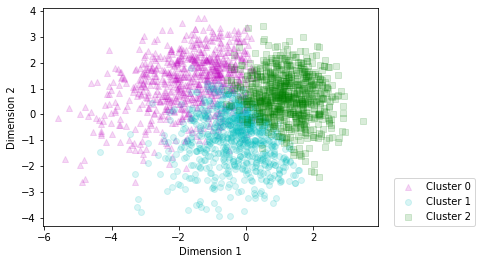

In [17]:
# project training data onto 2-D using principal components
# join with clusters labels
# plot
pca = H2OPrincipalComponentAnalysisEstimator(k=3) # REQUIRES STUDENT INPUT
pca.train(x=X, training_frame=labeled_frame)
features = pca.predict(labeled_frame)
features_pandas = features.as_data_frame()
features_pandas['label'] = labeled_frame[-1].as_data_frame()
print(features_pandas.head())
plot(features_pandas)

18. Shutdown h2o

In [18]:
# shutdown h2o
h2o.cluster().shutdown(prompt=False)

H2O session _sid_8a38 closed.
